<a href="https://colab.research.google.com/github/Lulu-1121/Explainable-Techniques/blob/main/Explainable-Techniques.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# XAI CODE DEMO
[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/Lulu-1121/AIPI-590-XAI-Interpretable-ML/blob/main/Explainable-Techniques.ipynb)

# Explainable Techniques II — Part 1
## Hongyi Duan (hd162)

### Model: Random Forest Regressor
### Dataset: California Housing

(note: no AI tool is used)

In [2]:
%pip -q install pyALE

In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.datasets import fetch_california_housing
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error, r2_score
from sklearn.inspection import PartialDependenceDisplay
from PyALE import ale

plt.rcParams['figure.dpi'] = 400
np.random.seed(42)

### Load data and fit a baseline model

In [4]:
# Load California Housing dataset
cal = fetch_california_housing(as_frame=True)
df = cal.frame.copy()
df = df.rename(columns={"MedHouseVal": "target"})

print(df.shape)
df.head()

(20640, 9)


,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,Latitude,Longitude,target
0,8.3252,41.0,6.984127,1.023810,322.0,2.555556,37.88,-122.23,4.526
1,8.3014,21.0,6.238137,0.971880,2401.0,2.109842,37.86,-122.22,3.585
2,7.2574,52.0,8.288136,1.073446,496.0,2.802260,37.85,-122.24,3.521
3,5.6431,52.0,5.817352,1.073059,558.0,2.547945,37.85,-122.25,3.413
4,3.8462,52.0,6.281853,1.081081,565.0,2.181467,37.85,-122.25,3.422


In [5]:
# Split features/target
X = df.drop(columns=["target"])
y = df["target"]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
X_train.shape, X_test.shape

((16512, 8), (4128, 8))

In [6]:
# A compact RandomForest with sensible defaults
rf = RandomForestRegressor(
    n_estimators=300,
    max_depth=None,
    min_samples_leaf=2,
    n_jobs=-1,
    random_state=42,
)
rf.fit(X_train, y_train)

# Evaluate
pred_tr = rf.predict(X_train)
pred_te = rf.predict(X_test)

print("Train R2:", r2_score(y_train, pred_tr))
print("Test R2:", r2_score(y_test,  pred_te))
print("Test MAE:", mean_absolute_error(y_test, pred_te))

Train R2: 0.9590970847136436
Test  R2: 0.8061901171533774
Test MAE: 0.3262806348881271


### Exploratory correlation analysis

In [7]:
# Pearson correlations among features and with the target
corr = df.corr(numeric_only=True)
abs_with_target = (
    corr["target"].drop("target").abs().sort_values(ascending=False)
)
abs_with_target

,target
MedInc,0.688075
AveRooms,0.151948
Latitude,0.144160
HouseAge,0.105623
AveBedrms,0.046701
Longitude,0.045967
Population,0.024650
AveOccup,0.023737


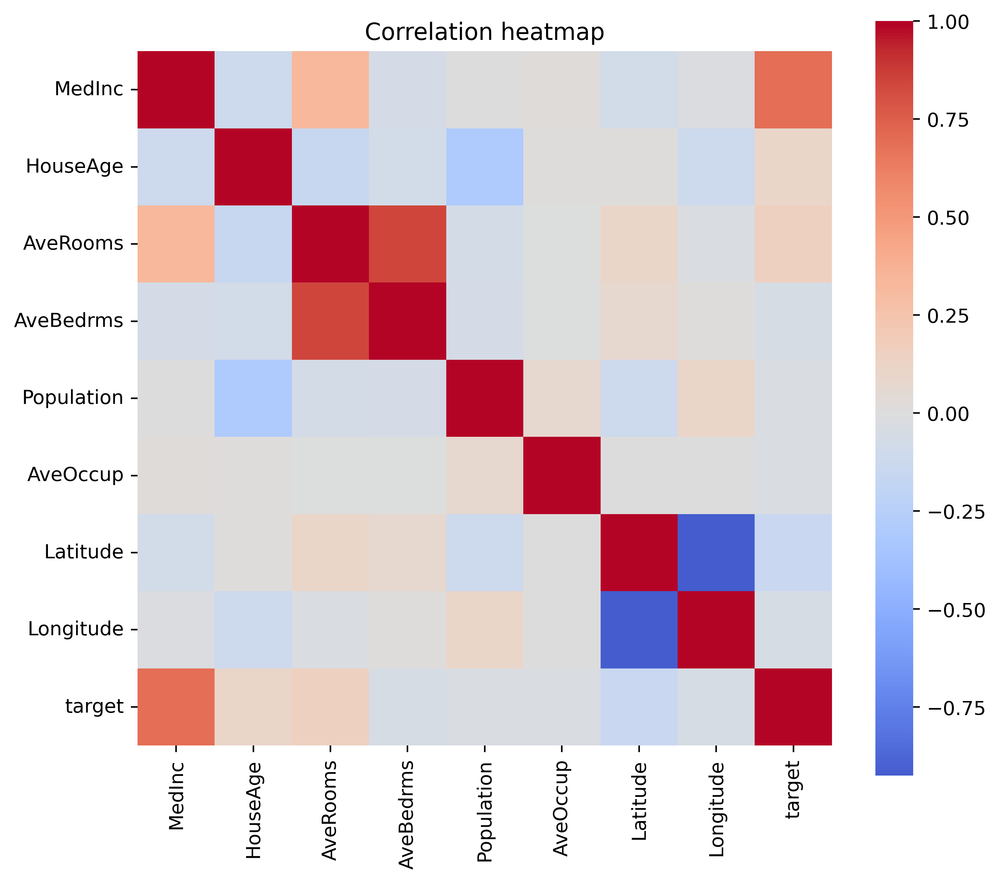

In [8]:
# Heatmap for a visual overview
plt.figure(figsize=(8,7))
sns.heatmap(corr, cmap="coolwarm", center=0, annot=False, square=True)
plt.title("Correlation heatmap")
plt.show()

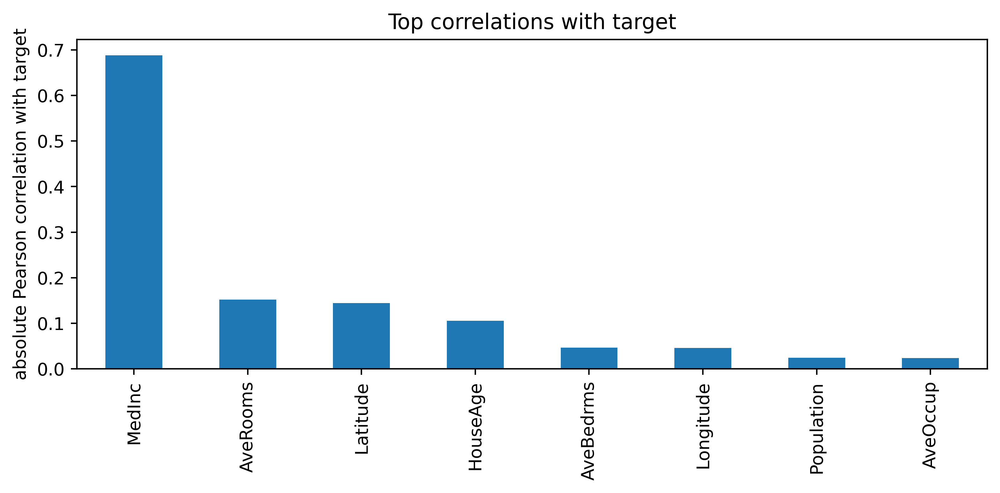

['MedInc', 'AveRooms', 'Latitude']

In [9]:
# Bar plot of absolute correlation with target
plt.figure(figsize=(8,4))
abs_with_target.plot(kind="bar")
plt.ylabel("absolute Pearson correlation with target")
plt.title("Top correlations with target")
plt.tight_layout()
plt.show()

# Choose three features to explain later
top3 = abs_with_target.head(3).index.tolist()
top3

From the correlation analysis, I see that median income (MedInc) has by far the strongest relationship with the target, which makes sense since housing values are highly dependent on income levels. The next group of features, like average rooms and latitude, show weaker but still noticeable correlations. House age also has some influence, though it is less pronounced. Longitude, population, and occupancy rate are only weakly related. The heatmap also highlights strong correlations among some predictors themselves, such as average rooms and bedrooms, which I need to keep in mind when interpreting feature effects since multicollinearity could distort the global correlation picture. Overall, MedInc clearly dominates, while the rest contribute more moderately.

### PDP and ICE plots

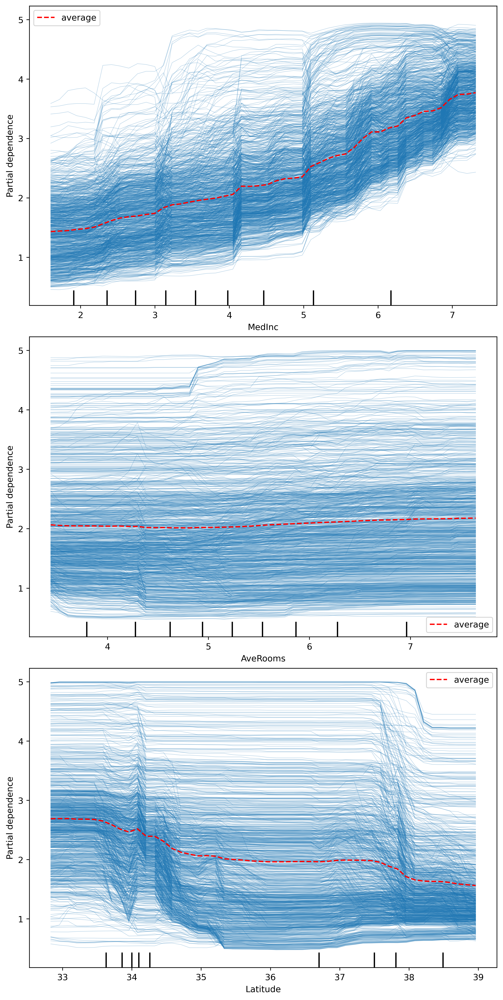

In [10]:
feat_1, feat_2, feat_3 = top3

# PDP + ICE for each feature
fig, axes = plt.subplots(3, 1, figsize=(8,16), constrained_layout=True)
for ax, f in zip(axes, [feat_1, feat_2, feat_3]):
    PartialDependenceDisplay.from_estimator(
        rf, X_train, [f], kind="both", grid_resolution=50, ax=ax,
        pd_line_kw={'color': 'red'}
    )
    ax.set_title(f"PDP + ICE for {f}")
plt.show()

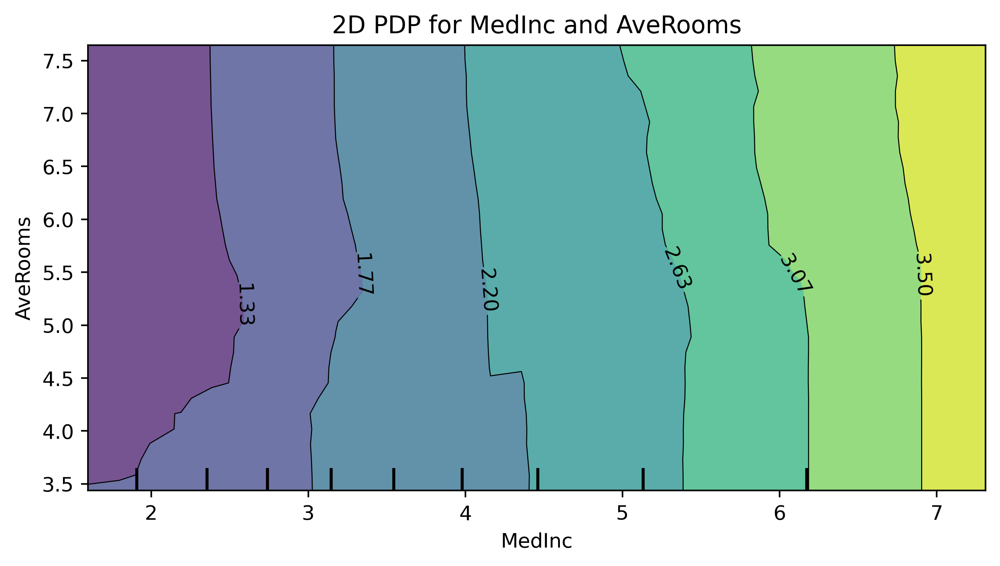

In [11]:
# 2D PDP for the two strongest features
pair = (feat_1, feat_2)
fig, ax = plt.subplots(figsize=(8,4))
PartialDependenceDisplay.from_estimator(
    rf, X_train, [pair], kind="average", grid_resolution=30, ax=ax
)
ax.set_title(f"2D PDP for {pair[0]} and {pair[1]}")
plt.show()

From the PDP and ICE results, I can see that median income has a strong and consistent positive effect on the target, with most ICE lines following the same upward trend. This indicates a stable relationship between higher income and higher housing values. For average rooms, the average effect is weak, but the ICE lines show a lot of variation, suggesting interactions with other features. Latitude shows a non-linear effect where predictions change direction depending on the range, and the spread of ICE lines highlights regional differences. The 2D PDP of median income and average rooms makes it clear that income is the dominant factor, while rooms provide only a small adjustment on top of income.

### ALE plots

INFO:PyALE._ALE_generic:Continuous feature detected.
INFO:PyALE._ALE_generic:Continuous feature detected.
INFO:PyALE._ALE_generic:Continuous feature detected.


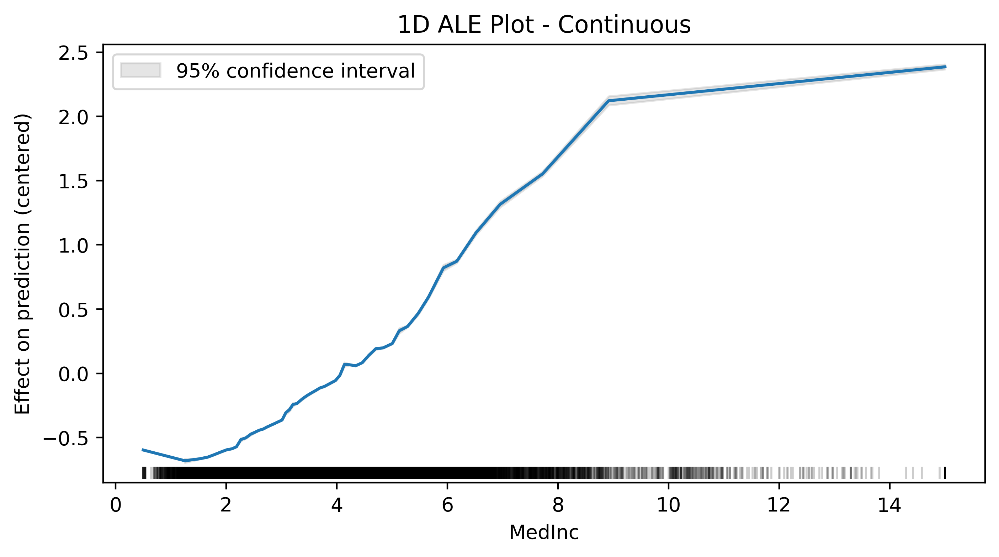

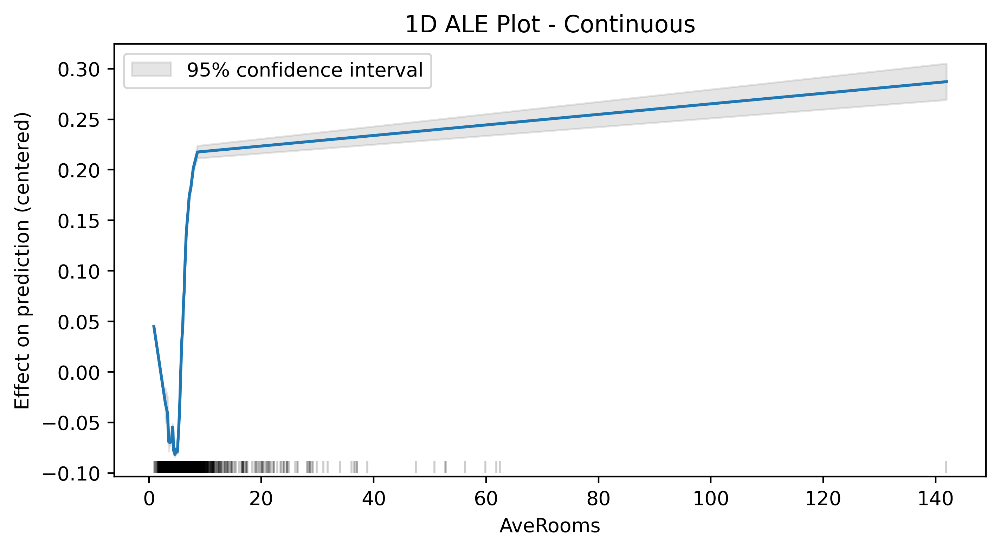

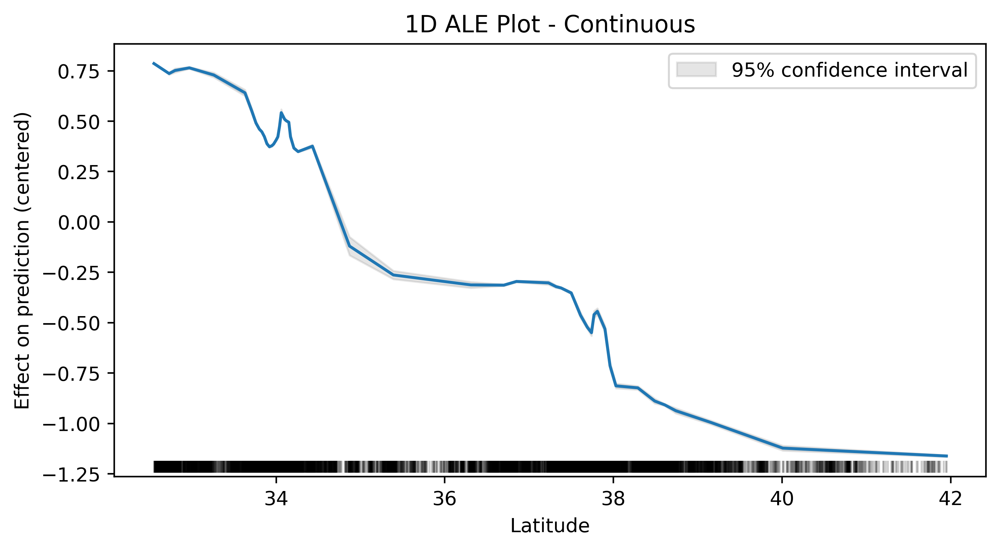

In [12]:
# 1D ALE for the same three features
for f in [feat_1, feat_2, feat_3]:
    ale(
        X=X_train,
        model=rf,
        feature=[f],
        grid_size=50
    )

AveRooms,0.888889,3.220000,3.587121,3.794745,3.975379,4.138728,4.276596,4.393728,4.510129,4.620991,...,5.866667,5.992481,6.128767,6.277778,6.448105,6.667954,6.961390,7.341826,8.062893,141.909091
MedInc,,,,,,,,,,,,,,,,,,,,,
0.4999,0.145431,0.089985,-0.008828,-0.021617,-0.045776,-0.053637,-0.041349,-0.062841,-0.058034,-0.053930,...,-0.049484,-0.060581,-0.062811,-0.055981,-0.058862,-0.043786,-0.060701,-0.049930,-0.052124,0.272835
1.4397,0.053918,0.024463,-0.010620,-0.023389,-0.023027,-0.026796,-0.008350,-0.022774,-0.017490,-0.014152,...,-0.005389,-0.016486,-0.018349,-0.011248,-0.012435,0.003226,-0.011799,0.000227,-0.001988,0.321848
1.7039,0.041711,0.032156,-0.006504,-0.020820,-0.022529,-0.025609,-0.011449,-0.025837,-0.021567,-0.017860,...,-0.006445,-0.016388,-0.016358,-0.009135,-0.010248,0.006920,-0.007501,0.007169,0.005434,0.338954
1.9091,0.034271,0.053327,0.012189,-0.001861,-0.015787,-0.018997,-0.012656,-0.042537,-0.038594,-0.034441,...,-0.007663,-0.018119,-0.018130,-0.011484,-0.012408,0.006459,-0.011309,0.002621,0.005287,0.331563
2.0764,0.018546,0.047539,0.017411,0.004419,-0.002406,-0.004179,-0.003591,-0.047808,-0.044429,-0.040182,...,-0.007478,-0.017467,-0.017226,-0.015457,-0.016423,0.002955,-0.016520,-0.001324,0.001952,0.325086
2.2121,0.008262,0.041856,0.028441,0.014532,0.010229,0.008051,0.004348,-0.041848,-0.051152,-0.047393,...,-0.012806,-0.022485,-0.020395,-0.017538,-0.017335,0.004717,-0.015436,-0.003952,0.005285,0.315740
2.3565,0.032368,0.025625,0.045926,0.044729,0.045758,0.047571,0.037825,-0.051270,-0.064467,-0.062470,...,-0.029877,-0.037892,-0.035258,-0.026408,-0.026361,-0.005734,-0.026194,-0.011498,0.001149,0.269415
2.5068,-0.031584,-0.026842,-0.004229,-0.005124,-0.001222,-0.001199,0.002187,-0.033592,-0.040156,-0.035408,...,0.011315,0.002668,0.013893,0.024151,0.043827,0.062403,0.038469,0.057276,0.068132,0.150113
2.6250,-0.049719,-0.038590,-0.012285,-0.011786,-0.009058,-0.008390,-0.003241,-0.023963,-0.027500,-0.023093,...,0.015523,0.009904,0.028456,0.036223,0.057837,0.074198,0.049953,0.067322,0.080165,0.094498


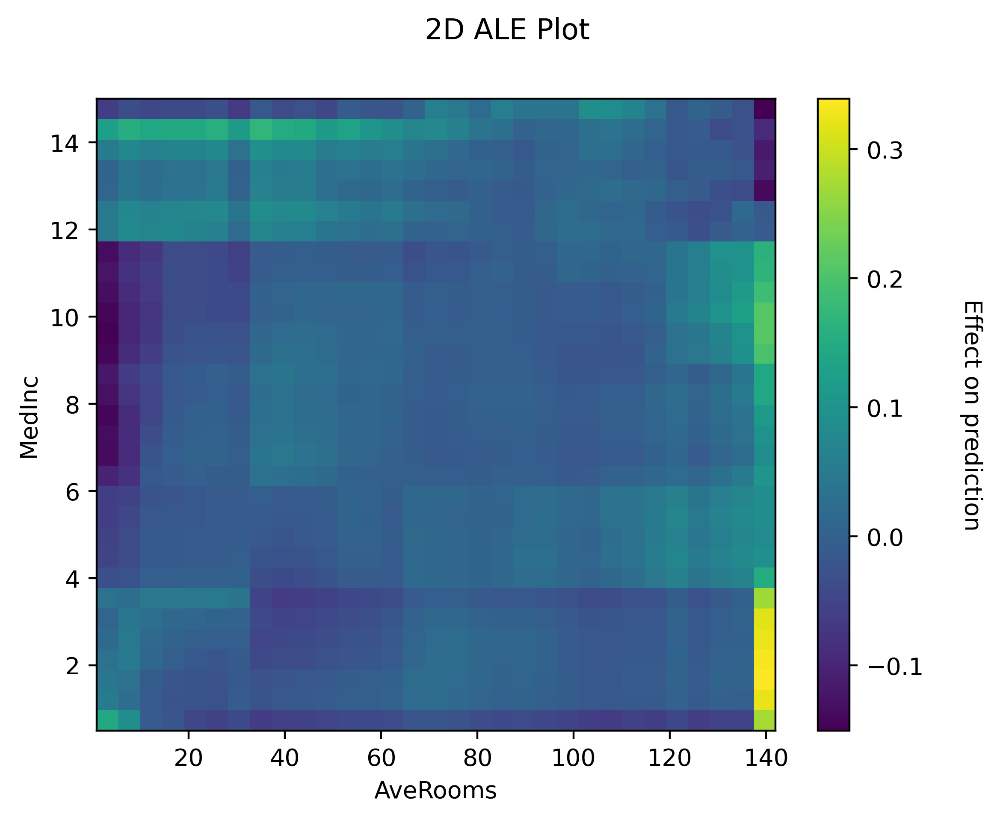

In [13]:
# 2D ALE for the same pair as 2D PDP
ale(
    X=X_train,
    model=rf,
    feature=[feat_1, feat_2],
    grid_size=30
)

From the ALE results, I can see that median income has a clear monotonic effect, with higher income steadily driving predictions up. The effect is smooth and strong, which matches expectations. Average rooms shows a very small effect overall, with most of the variation concentrated at very low values that are rare in the data. Latitude has a more complex and non-linear pattern, where lower latitudes are linked to higher predictions and the effect decreases steadily as latitude increases. Compared to PDP, these ALE curves feel less distorted by correlations, giving me more confidence that they reflect real local effects.